In [1]:
# Imports for Model Creation
import torch
from torch.nn import functional as F
from torch.nn import (
	Module, Conv2d, ReLU, PReLU, Dropout2d, AvgPool2d,
	Upsample, MaxPool2d, Sequential, MaxUnpool2d,
	BatchNorm2d, AdaptiveAvgPool2d, ConvTranspose2d
)

In [2]:
class Mish(Module):

	def __init(self):
		super().__init__()
	
	def forward(self, input):
		return input * torch.tanh(F.softplus(input))

In [3]:
class Activation(Module):
	
	def __init__(self, name='relu'):
		super().__init__()
		self.name = name
		if name == 'relu':
			self.act = ReLU()
		elif name == 'prelu':
			self.act = PReLU()
		elif name == 'mish':
			self.act = Mish()

	def forward(self, input):
		return self.act(input)

In [4]:
class InitialBlock(Module):
	
	def __init__(self, in_channels, out_channels, bias=False, activation='relu'):
		super().__init__()
		self.main_branch = Conv2d(
			in_channels, out_channels - 3,
			kernel_size=3, stride=2,
			padding=1, bias=bias
		)
		self.secondary_branch = MaxPool2d(3, stride=2, padding=1)
		self.batch_norm = BatchNorm2d(out_channels)
		self.activation = Activation(activation)

	def forward(self, x):
		main = self.main_branch(x)
		secondary = self.secondary_branch(x)
		output = torch.cat((main, secondary), 1)
		output = self.batch_norm(output)
		output = self.activation(output)
		return output

In [5]:
class RegularBottleneckBlock(Module):

	def __init__(
		self, channels, internal_ratio=4, kernel_size=3, padding=0,
		dilation=1, asymmetric=False, dropout_prob=0, bias=False, activation='relu'):
		
		super().__init__()
		internal_channels = channels // internal_ratio
		
		### Main Branch ###
		
		# Block 1 Conv 1x1
		self.main_conv_block_1 = Sequential(
			Conv2d(
				channels, internal_channels,
				kernel_size=1, stride=1, bias=bias
			),
			BatchNorm2d(internal_channels),
			Activation(activation)
		)

		# Block 2
		if asymmetric:
			self.main_conv_block_2 = Sequential(
				Conv2d(
					internal_channels, internal_channels,
					kernel_size=(kernel_size, 1), stride=1,
					padding=(padding, 0), dilation=dilation, bias=bias
				),
				BatchNorm2d(internal_channels),
				Activation(activation),
				Conv2d(
					internal_channels, internal_channels,
					kernel_size=(1, kernel_size), stride=1,
					padding=(0, padding), dilation=dilation, bias=bias
				),
				BatchNorm2d(internal_channels),
				Activation(activation),
			)
		else:
			self.main_conv_block_2 = Sequential(
				Conv2d(
					internal_channels, internal_channels,
					kernel_size=kernel_size, stride=1,
					padding=padding, dilation=dilation, bias=bias
				),
				BatchNorm2d(internal_channels),
				Activation(activation),
			)
		
		# Block 3 Conv 1x1
		self.main_conv_block_3 = Sequential(
			Conv2d(
				internal_channels, channels,
				kernel_size=1, stride=1, bias=bias
			),
			BatchNorm2d(channels),
			Activation(activation),
		)

		# Dropout Regularization
		self.dropout = Dropout2d(p=dropout_prob)

		# Activation
		self.activation = Activation(activation)
	
	def forward(self, x):
		secondary_branch = x
		main_branch = self.main_conv_block_1(x)
		main_branch = self.main_conv_block_2(main_branch)
		main_branch = self.main_conv_block_3(main_branch)
		main_branch = self.dropout(main_branch)
		output = main_branch + secondary_branch
		output = self.activation(output)
		return output

In [6]:
class DownsampleBottleneckBlock(Module):

	def __init__(
		self, in_channels, out_channels, internal_ratio=4,
		return_indices=False, dropout_prob=0, bias=False, activation='relu'):
		
		super().__init__()
		internal_channels = in_channels // internal_ratio
		self.return_indices = return_indices

		### Main Branch ###

		# Block 1 Conv 1x1
		self.main_conv_block_1 = Sequential(
			Conv2d(
				in_channels, internal_channels,
				kernel_size=2, stride=2, bias=bias
			),
			BatchNorm2d(internal_channels),
			Activation(activation)
		)

		# Block 2 Conv 3x3
		self.main_conv_block_2 = Sequential(
			Conv2d(
				internal_channels, internal_channels,
				kernel_size=3, stride=1, padding=1, bias=bias
			),
			BatchNorm2d(internal_channels),
			Activation(activation)
		)

		# Block 2 Conv 1x1
		self.main_conv_block_3 = Sequential(
			Conv2d(
				internal_channels, out_channels,
				kernel_size=1, stride=1, bias=bias
			),
			BatchNorm2d(out_channels),
			Activation(activation)
		)

		### Secondary Branch ###
		self.secondary_maxpool = MaxPool2d(
			2, stride=2,
			return_indices=return_indices
		)

		# Dropout Regularization
		self.dropout = Dropout2d(p=dropout_prob)

		# Activation
		self.activation = Activation(activation)
	

	def forward(self, x):
		# Main Branch
		main_branch = self.main_conv_block_1(x)
		main_branch = self.main_conv_block_2(main_branch)
		main_branch = self.main_conv_block_3(main_branch)
		# Secondary Branch
		if self.return_indices:
			secondary_branch, max_indices = self.secondary_maxpool(x)
		else:
			secondary_branch = self.secondary_maxpool(x)
		# Padding
		n, ch_main, h, w = main_branch.size()
		ch_sec = secondary_branch.size()[1]
		padding = torch.zeros(n, ch_main - ch_sec, h, w)
		if secondary_branch.is_cuda:
			padding = padding.cuda()
		# Concatenate
		secondary_branch = torch.cat((secondary_branch, padding), 1)
		output = secondary_branch + main_branch
		output = self.activation(output)
		if self.return_indices:
			return output, max_indices
		else:
			return output

In [7]:
class UpsampleBottleneckBlock(Module):

	def __init__(
		self, in_channels, out_channels,
		internal_ratio=4, dropout_prob=0,
		bias=False, activation='relu'):
		
		super().__init__()
		internal_channels = in_channels // internal_ratio

		### Main Branch ###

		# Block 1 Conv 1x1
		self.main_branch_conv_1 = Sequential(
			Conv2d(
				in_channels, internal_channels,
				kernel_size=1, bias=bias
			),
			BatchNorm2d(internal_channels),
			Activation(activation)
		)

		# Block 2 Transposed Convolution
		self.main_branch_transpose_conv_2 = ConvTranspose2d(
			internal_channels, internal_channels,
			kernel_size=2, stride=2, bias=bias
		)
		self.main_branch_bn_2 = BatchNorm2d(internal_channels)
		self.main_branch_act_2 = Activation(activation)

		# Block 3 Conv 1x1
		self.main_branch_conv_3 = Sequential(
			Conv2d(
				internal_channels, out_channels,
				kernel_size=1, bias=bias
			),
			BatchNorm2d(out_channels),
			Activation(activation)
		)

		### Secondary Branch ###
		self.secondary_conv = Sequential(
			Conv2d(
				in_channels, out_channels,
				kernel_size=1, bias=bias
			),
			BatchNorm2d(out_channels)
		)
		self.secondary_unpool = MaxUnpool2d(kernel_size=2)

		# Dropout Regularization
		self.dropout = Dropout2d(p=dropout_prob)

		# Activation
		self.activation = Activation(activation)
	

	def forward(self, x, max_indices, output_size):
		# Main Branch
		main_branch = self.main_branch_conv_1(x)
		main_branch = self.main_branch_transpose_conv_2(main_branch, output_size=output_size)
		main_branch = self.main_branch_bn_2(main_branch)
		main_branch = self.main_branch_act_2(main_branch)
		main_branch = self.main_branch_conv_3(main_branch)
		main_branch = self.dropout(main_branch)
		# Secondary Branch
		secondary_branch = self.secondary_conv(x)
		secondary_branch = self.secondary_unpool(
			secondary_branch, max_indices,
			output_size=output_size
		)
		# Concatenate
		output = main_branch + secondary_branch
		output = self.activation(output)
		return output

In [8]:
class Enet(Module):

	def __init__(self, num_classes, encoder_activation='mish', decoder_activation='relu'):
		
		super().__init__()
		
		# Initial Block
		self.initial_block = InitialBlock(3, 16, activation=encoder_activation)
		
		### Encoding Stages ###

		# Stage 1
		self.down_bottleneck_1 = DownsampleBottleneckBlock(
			16, 64, return_indices=True,
			dropout_prob=0.01, activation=encoder_activation
		)
		self.bottleneck_1_1 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.01,
			activation=encoder_activation
		)
		self.bottleneck_1_2 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.01,
			activation=encoder_activation
		)
		self.bottleneck_1_3 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.01,
			activation=encoder_activation
		)
		self.bottleneck_1_4 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.01,
			activation=encoder_activation
		)

		# Stage 2
		self.down_bottleneck_2 = DownsampleBottleneckBlock(
			64, 128, return_indices=True,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_2_1 = RegularBottleneckBlock(
			128, padding=1, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_2_2 = RegularBottleneckBlock(
			128, dilation=2,
			padding=2, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_2_3 = RegularBottleneckBlock(
			128, kernel_size=5, padding=2,
            asymmetric=True, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_2_4 = RegularBottleneckBlock(
			128, dilation=4, padding=4,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_2_5 = RegularBottleneckBlock(
			128, padding=1, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_2_6 = RegularBottleneckBlock(
			128, dilation=8, padding=8,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_2_7 = RegularBottleneckBlock(
			128, kernel_size=5, asymmetric=True,
            padding=2, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_2_8 = RegularBottleneckBlock(
			128, dilation=16, padding=16,
			dropout_prob=0.1, activation=encoder_activation
		)

		# Stage 3
		self.regular_bottleneck_3 = RegularBottleneckBlock(
			128, padding=1, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_3_1 = RegularBottleneckBlock(
			128, dilation=2, padding=2,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_3_2 = RegularBottleneckBlock(
			128, kernel_size=5, padding=2,
            asymmetric=True, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_3_3 = RegularBottleneckBlock(
			128, dilation=4, padding=4,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_3_4 = RegularBottleneckBlock(
			128, padding=1, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_3_5 = RegularBottleneckBlock(
			128, dilation=8, padding=8,
			dropout_prob=0.1, activation=encoder_activation
		)
		self.bottleneck_3_6 = RegularBottleneckBlock(
			128, kernel_size=5, asymmetric=True,
            padding=2, dropout_prob=0.1,
			activation=encoder_activation
		)
		self.bottleneck_3_7 = RegularBottleneckBlock(
			128, dilation=16, padding=16,
			dropout_prob=0.1, activation=encoder_activation
		)

		# Stage 4
		self.upsample_4 = UpsampleBottleneckBlock(
			128, 64, dropout_prob=0.1,
			activation=decoder_activation
		)
		self.bottleneck_4_1 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.1,
			activation=decoder_activation
		)
		self.bottleneck_4_2 = RegularBottleneckBlock(
			64, padding=1, dropout_prob=0.1,
			activation=decoder_activation
		)

		# Stage 5
		self.upsample_5 = UpsampleBottleneckBlock(
			64, 16, dropout_prob=0.1,
			activation=decoder_activation
		)
		self.bottleneck_5 = RegularBottleneckBlock(
			16, padding=1, dropout_prob=0.1,
			activation=decoder_activation
		)
		self.transposed_conv = ConvTranspose2d(
			16, num_classes, kernel_size=3,
            stride=2, padding=1, output_padding=1, bias=False
		)

	def forward(self, x):
		# Initial Block
		input_size = x.size()
		x = self.initial_block(x)
		# Stage 1
		input_size_1 = x.size()
		x, max_indices_1 = self.down_bottleneck_1(x)
		x = self.bottleneck_1_1(x)
		x = self.bottleneck_1_2(x)
		x = self.bottleneck_1_3(x)
		x = self.bottleneck_1_4(x)
		# Stage 2
		input_size_2 = x.size()
		x, max_indices_2 = self.down_bottleneck_2(x)
		x = self.bottleneck_2_1(x)
		x = self.bottleneck_2_2(x)
		x = self.bottleneck_2_3(x)
		x = self.bottleneck_2_4(x)
		x = self.bottleneck_2_5(x)
		x = self.bottleneck_2_6(x)
		x = self.bottleneck_2_7(x)
		x = self.bottleneck_2_8(x)
		# Stage 3
		x = self.regular_bottleneck_3(x)
		x = self.bottleneck_3_1(x)
		x = self.bottleneck_3_2(x)
		x = self.bottleneck_3_3(x)
		x = self.bottleneck_3_4(x)
		x = self.bottleneck_3_5(x)
		x = self.bottleneck_3_6(x)
		x = self.bottleneck_3_7(x)
		# Stage 4
		x = self.upsample_4(x, max_indices_2, output_size=input_size_2)
		x = self.bottleneck_4_1(x)
		x = self.bottleneck_4_2(x)
		# Stage 5
		x = self.upsample_5(x, max_indices_1, output_size=input_size_1)
		x = self.bottleneck_5(x)
		x = self.transposed_conv(x)
		return x

In [9]:
print('GPU:', torch.cuda.get_device_name(0))
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
enet = Enet(12, encoder_activation='mish', decoder_activation='mish')
enet = enet.to(device)

GPU: Quadro P5000


In [10]:
!mkdir camvid
%cd camvid
!wget https://www.dropbox.com/s/ej1gx48bxqbtwd2/CamVid.zip?dl=0 -O CamVid.zip
!unzip -qq CamVid.zip
!rm CamVid.zip
%cd ..

/notebooks/Enet/camvid
--2020-01-10 18:02:14--  https://www.dropbox.com/s/ej1gx48bxqbtwd2/CamVid.zip?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.2.1, 2620:100:6017:1::a27d:201
Connecting to www.dropbox.com (www.dropbox.com)|162.125.2.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/ej1gx48bxqbtwd2/CamVid.zip [following]
--2020-01-10 18:02:14--  https://www.dropbox.com/s/raw/ej1gx48bxqbtwd2/CamVid.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc38815a88f8874cc963ec5ccb92.dl.dropboxusercontent.com/cd/0/inline/Av50hpKPadxOCgGvAcl5El5Iksc78axVgk1ToeRUDWc_U7Dr8xjAp0WISWb4RU7C1KPP__FN189X3C_vy8-1A8OxtFZITQtzQ9EpZbjDkxd6IgVsC8kUf0djsP8TnuWWuos/file# [following]
--2020-01-10 18:02:14--  https://uc38815a88f8874cc963ec5ccb92.dl.dropboxusercontent.com/cd/0/inline/Av50hpKPadxOCgGvAcl5El5Iksc78axVgk1ToeRUDWc_U7Dr8xjAp0WISWb4RU7C1KPP__FN189X3C_vy8-1A8OxtFZI

In [11]:
import numpy as np
import torch, os
from glob import glob
from time import time
from tqdm import tqdm
from PIL import Image
from torch.nn import functional as F
from matplotlib import pyplot as plt
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchvision.transforms import ToTensor, ToPILImage

In [12]:
class CamVidDataset(Dataset):

	def __init__(self, images, labels, height, width):
		self.images = images
		self.labels = labels
		self.height = height
		self.width = width
	
	def __len__(self):
		return len(self.images)
	
	def __getitem__(self, index):
		image_id = self.images[index]
		label_id = self.labels[index]
		# Read Image
		x = Image.open(image_id)
		x = [np.array(x)]
		x = np.stack(x, axis=2)
		x = torch.tensor(x).transpose(0, 2).transpose(1, 3) # Convert to N, C, H, W
		# Read Mask
		y = Image.open(label_id)
		y = [np.array(y)]
		y = torch.tensor(y)
		return x.squeeze(), y.squeeze()

In [13]:
train_images = sorted(glob('./camvid/train/*'))
train_labels = sorted(glob('./camvid/trainannot/*'))
val_images = sorted(glob('./camvid/val/*'))
val_labels = sorted(glob('./camvid/valannot/*'))
test_images = sorted(glob('./camvid/test/*'))
test_labels = sorted(glob('./camvid/testannot/*'))
batch_size = 10

In [14]:
train_dataset = CamVidDataset(train_images, train_labels, 512, 512)
val_dataset = CamVidDataset(val_images, val_labels, 512, 512)
test_dataset = CamVidDataset(test_images, test_labels, 512, 512)

In [15]:
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True, num_workers=4)

In [16]:
def decode_segmap(image, color_dict):
    label_colours = np.array([
		color_dict['obj0'], color_dict['obj1'],
		color_dict['obj2'], color_dict['obj3'],
		color_dict['obj4'], color_dict['obj5'],
		color_dict['obj6'], color_dict['obj7'],
		color_dict['obj8'], color_dict['obj9'],
		color_dict['obj10'], color_dict['obj11']
	]).astype(np.uint8)
    r = np.zeros_like(image).astype(np.uint8)
    g = np.zeros_like(image).astype(np.uint8)
    b = np.zeros_like(image).astype(np.uint8)
    for l in range(0, 12):
        r[image == l] = label_colours[l, 0]
        g[image == l] = label_colours[l, 1]
        b[image == l] = label_colours[l, 2]
    rgb = np.zeros((image.shape[0], image.shape[1], 3)).astype(np.uint8)
    rgb[:, :, 0] = b
    rgb[:, :, 1] = g
    rgb[:, :, 2] = r
    return rgb

In [17]:
def predict_rgb(model, tensor, color_dict):
    with torch.no_grad():
        out = model(tensor.float()).squeeze(0)
    out = out.data.max(0)[1].cpu().numpy()
    return decode_segmap(out, color_dict)

In [18]:
color_dict = {
    'obj0' : [255, 0, 0], # Sky
    'obj1' : [0, 51, 204], # Building
    'obj2' : [0, 255, 255], # Posts
    'obj3' : [153, 102, 102], # Road
    'obj4' : [51, 0, 102], # Pavement
    'obj5' : [0, 255, 0], # Trees
    'obj6' : [102, 153, 153], # Signs
    'obj7' : [204, 0, 102], # Fence
    'obj8' : [102, 0, 0], # Car
    'obj9' : [0, 153, 102], # Pedestrian
    'obj10' : [255, 255, 255], # Cyclist
    'obj11' : [0, 0, 0] # bicycles
}

In [19]:
x_batch, y_batch = next(iter(train_loader))
x_batch.shape, y_batch.shape

(torch.Size([10, 3, 360, 480]), torch.Size([10, 360, 480]))

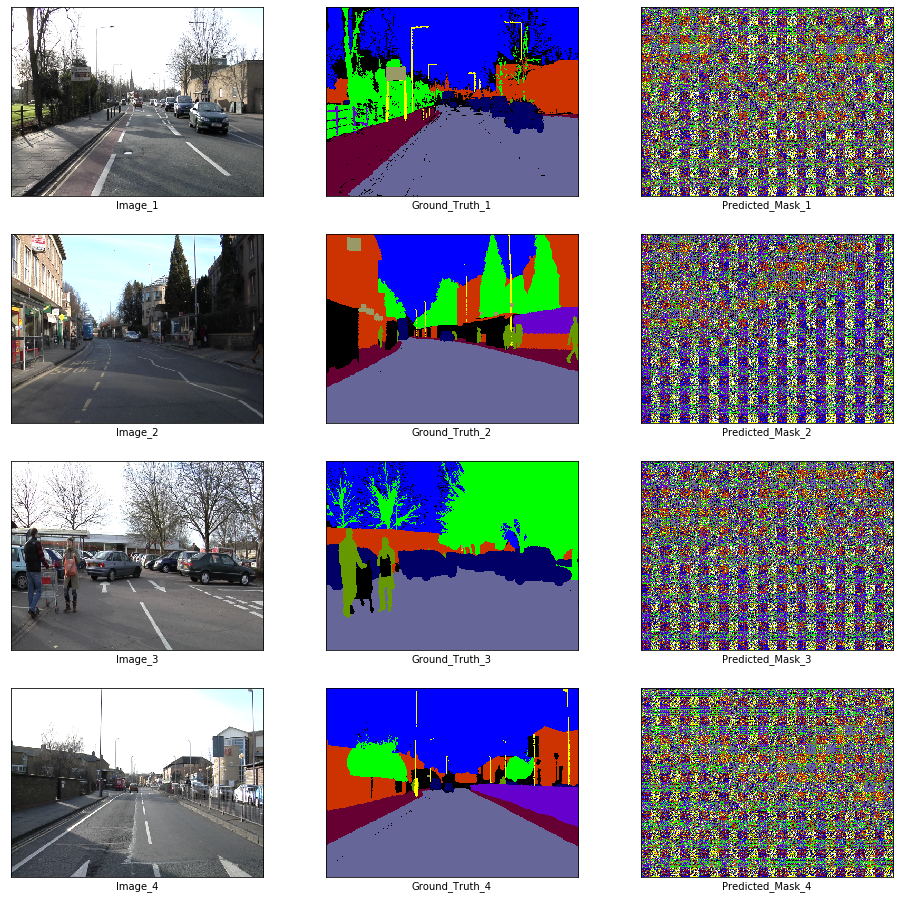

In [20]:
fig, axes = plt.subplots(nrows = 4, ncols = 3, figsize = (16, 16))
plt.setp(axes.flat, xticks = [], yticks = [])
c = 1
for i, ax in enumerate(axes.flat):
    if i % 3 == 0:
        ax.imshow(ToPILImage()(x_batch[c]))
        ax.set_xlabel('Image_' + str(c))
    elif i % 3 == 1:
        ax.imshow(decode_segmap(y_batch[c], color_dict))
        ax.set_xlabel('Ground_Truth_' + str(c))
    elif i % 3 == 2:
        ax.imshow(predict_rgb(enet, x_batch[c].unsqueeze(0).to(device), color_dict))
        ax.set_xlabel('Predicted_Mask_' + str(c))
        c += 1
plt.show()

In [21]:
from torch.optim import Adam
from torch.nn import CrossEntropyLoss

In [22]:
def get_class_weights(loader, num_classes, c=1.02):
    _, y= next(iter(loader))
    y_flat = y.flatten()
    each_class = np.bincount(y_flat, minlength=num_classes)
    p_class = each_class / len(y_flat)
    return 1 / (np.log(c + p_class))

In [23]:
class_weights = get_class_weights(train_loader, 12)
criterion = CrossEntropyLoss(
    weight=torch.FloatTensor(class_weights).to(device)
)
optimizer = Adam(
    enet.parameters(),
    lr=5e-4,
    weight_decay=2e-4
)

In [24]:
def train(
	model, train_dataloader, val_dataloader,
	device, criterion, optimizer, train_step_size, val_step_size,
	visualize_every, save_every, save_location, save_prefix, epochs):
	# Make sure that the checkpoint location exists
	try:
		os.mkdir(save_location)
	except:
		pass
	train_loss_history, val_loss_history = [], []
	# Training
	for epoch in range(1, epochs + 1):
		print('Epoch {}\n'.format(epoch))
		# Training
		start = time()
		train_loss = 0
		model.train()
		# Step Loop
		for step in tqdm(range(train_step_size)):
			x_batch, y_batch = next(iter(train_dataloader))
			x_batch = x_batch.squeeze().to(device)
			y_batch = y_batch.squeeze().to(device)
			optimizer.zero_grad()
			out = model(x_batch.float())
			loss = criterion(out, y_batch.long())
			loss.backward()
			optimizer.step()
			train_loss += loss.item()
		train_loss_history.append(train_loss / train_step_size)
		print('\nTraining Loss: {}'.format(train_loss_history[-1]))
		print('Training Time: {} seconds'.format(time() - start))
		# Validation
		val_loss = 0
		model.eval()
		for step in tqdm(range(val_step_size)):
			x_val, y_val = next(iter(val_dataloader))
			x_val = x_val.squeeze().to(device)
			y_val = y_val.squeeze().to(device)
			out = model(x_val.float())
			out = out.data.max(1)[1]
			val_loss += (y_val.long() - out.long()).float().mean()
		val_loss_history.append(val_loss)
		print('\nValidation Loss: {}'.format(val_loss))
		# Visualization
		if epoch % visualize_every == 0:
			x_batch, y_batch = next(iter(train_loader))
			fig, axes = plt.subplots(nrows = 4, ncols = 3, figsize = (16, 16))
			plt.setp(axes.flat, xticks = [], yticks = [])
			c = 1
			for i, ax in enumerate(axes.flat):
				if i % 3 == 0:
					ax.imshow(ToPILImage()(x_batch[c]))
					ax.set_xlabel('Image_' + str(c))
				elif i % 3 == 1:
					ax.imshow(decode_segmap(y_batch[c], color_dict))
					ax.set_xlabel('Ground_Truth_' + str(c))
				elif i % 3 == 2:
					ax.imshow(predict_rgb(enet, x_batch[c].unsqueeze(0).to(device), color_dict))
					ax.set_xlabel('Predicted_Mask_' + str(c))
					c += 1
			plt.show()
		# Checkpoints
		if epoch % save_every == 0:
			checkpoint = {
				'epoch' : epoch,
				'train_loss' : train_loss,
				'val_loss' : val_loss,
				'state_dict' : model.state_dict()
			}
			torch.save(
				checkpoint,
				'{}/{}-{}-{}-{}.pth'.format(
					save_location, save_prefix,
					epoch, train_loss, val_loss
				)
			)
			print('Checkpoint saved')
	print(
        '\nTraining Done.\nTraining Mean Loss: {:6f}\nValidation Mean Loss: {:6f}'.format(
            sum(train_loss_history) / epochs,
            sum(val_loss_history) / epochs
        )
    )
	return train_loss_history, val_loss_history

  0%|          | 0/36 [00:00<?, ?it/s]

Epoch 1



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 2.3980868260065713
Training Time: 41.25561189651489 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.159112930297852
Epoch 2



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 2.1203043427732258
Training Time: 40.3842351436615 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: 7.608865737915039
Epoch 3



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.8695931831995647
Training Time: 41.237016677856445 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: 7.239889621734619
Epoch 4



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.6891133354769812
Training Time: 40.8196816444397 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: 3.9542946815490723
Epoch 5



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.5924702551629808
Training Time: 41.17893123626709 seconds


100%|██████████| 10/10 [00:08<00:00,  1.19it/s]


Validation Loss: 2.2294445037841797


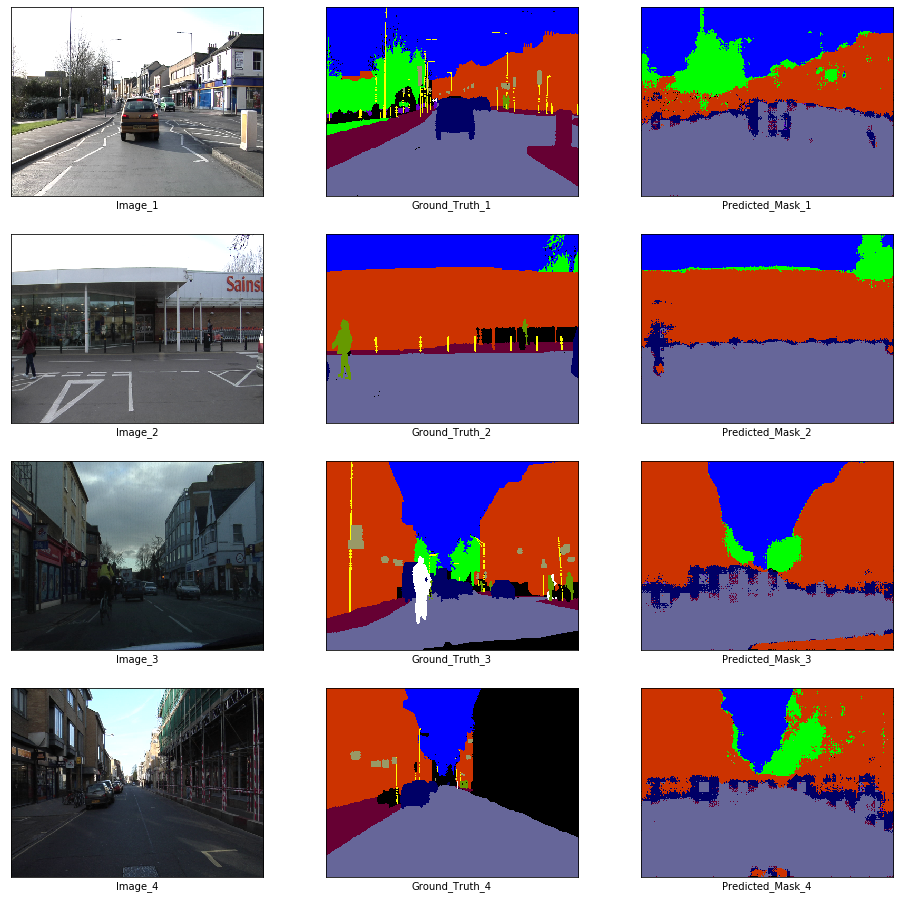

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 6



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.5115717119640775
Training Time: 40.08890104293823 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: 0.8173408508300781
Epoch 7



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.4325034949514601
Training Time: 39.989054441452026 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.3811845779418945
Epoch 8



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.3508556452062395
Training Time: 41.15414023399353 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.427826404571533
Epoch 9



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.2828876905971103
Training Time: 41.66800594329834 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.372166156768799
Epoch 10



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.2229653133286371
Training Time: 40.23258709907532 seconds


100%|██████████| 10/10 [00:09<00:00,  1.07it/s]


Validation Loss: -7.2807512283325195


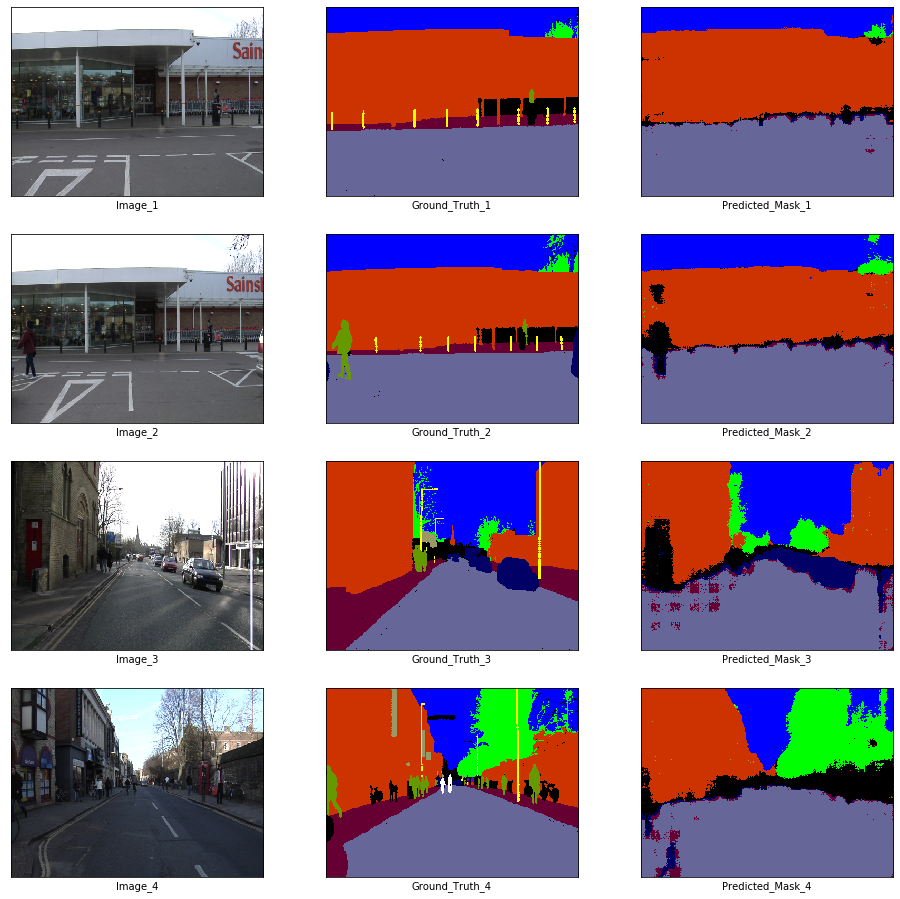

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 11



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.1736576226022508
Training Time: 41.83379316329956 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -7.1001410484313965
Epoch 12



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.1298834085464478
Training Time: 41.27827191352844 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -7.936367511749268
Epoch 13



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.1022504104508295
Training Time: 41.428462743759155 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.722842216491699
Epoch 14



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.068754255771637
Training Time: 41.18528342247009 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.761096477508545
Epoch 15



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 1.0254204803042941
Training Time: 41.71039867401123 seconds


100%|██████████| 10/10 [00:08<00:00,  1.15it/s]


Validation Loss: -8.544509887695312


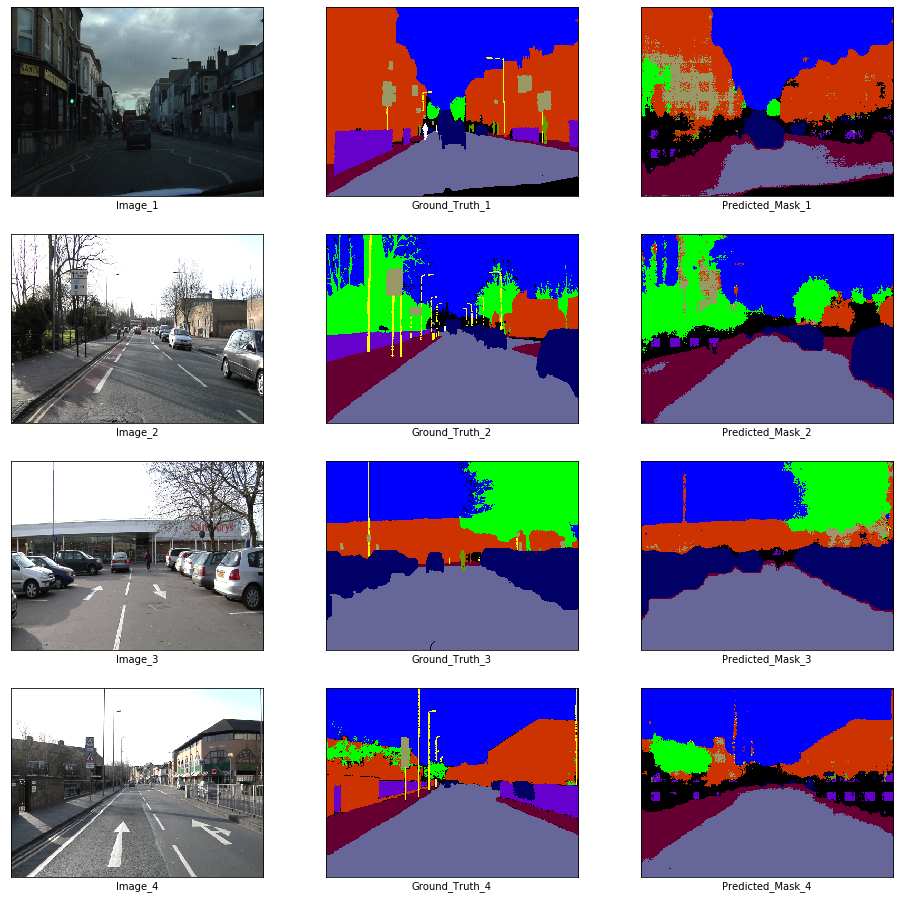

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 16



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.9898786048094431
Training Time: 41.78878307342529 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -10.358285903930664
Epoch 17



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.9425683303011788
Training Time: 40.8833372592926 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.657342433929443
Epoch 18



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.9127538767125871
Training Time: 41.26272773742676 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -7.05497932434082
Epoch 19



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.9103425724638833
Training Time: 41.12277817726135 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.971649169921875
Epoch 20



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.8848278803957833
Training Time: 40.18030095100403 seconds


100%|██████████| 10/10 [00:08<00:00,  1.13it/s]


Validation Loss: -4.844083309173584


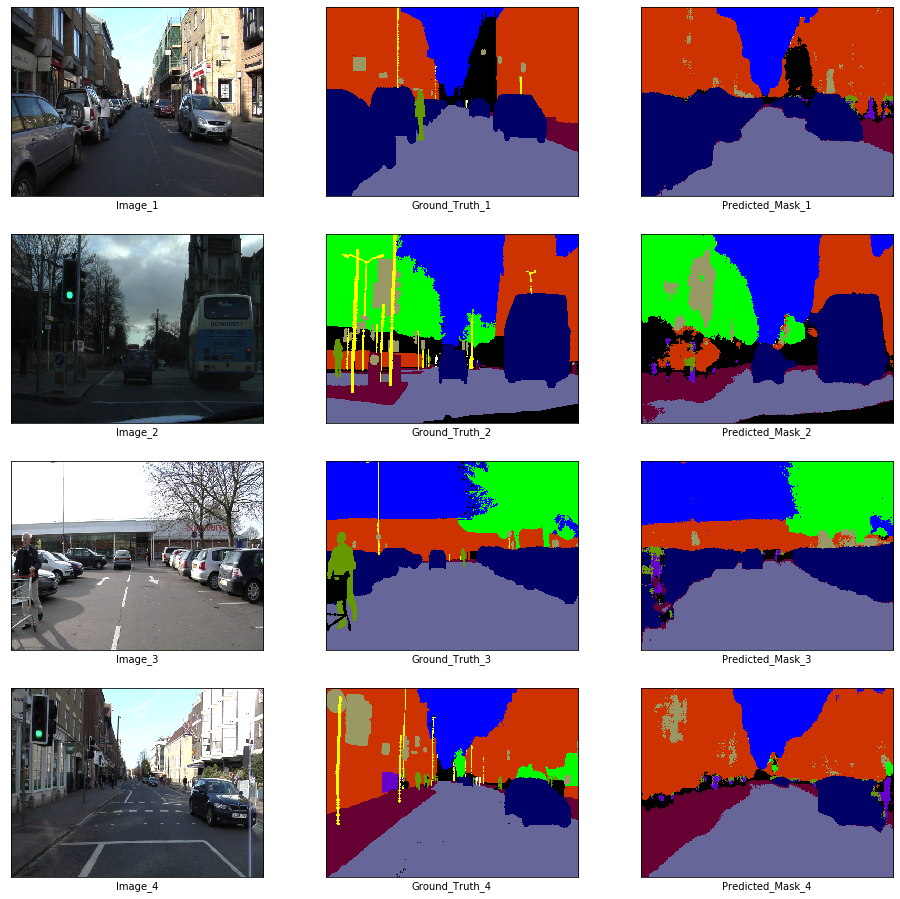

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 21



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.8360663801431656
Training Time: 41.015313386917114 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.345192909240723
Epoch 22



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.8330219917827182
Training Time: 41.63679766654968 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.139750957489014
Epoch 23



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.8008309023247825
Training Time: 42.25020956993103 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.9250712394714355
Epoch 24



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.7767404996686511
Training Time: 41.85469055175781 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.410292625427246
Epoch 25



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.7783147063520219
Training Time: 41.36243915557861 seconds


100%|██████████| 10/10 [00:09<00:00,  1.08it/s]


Validation Loss: -4.913580894470215


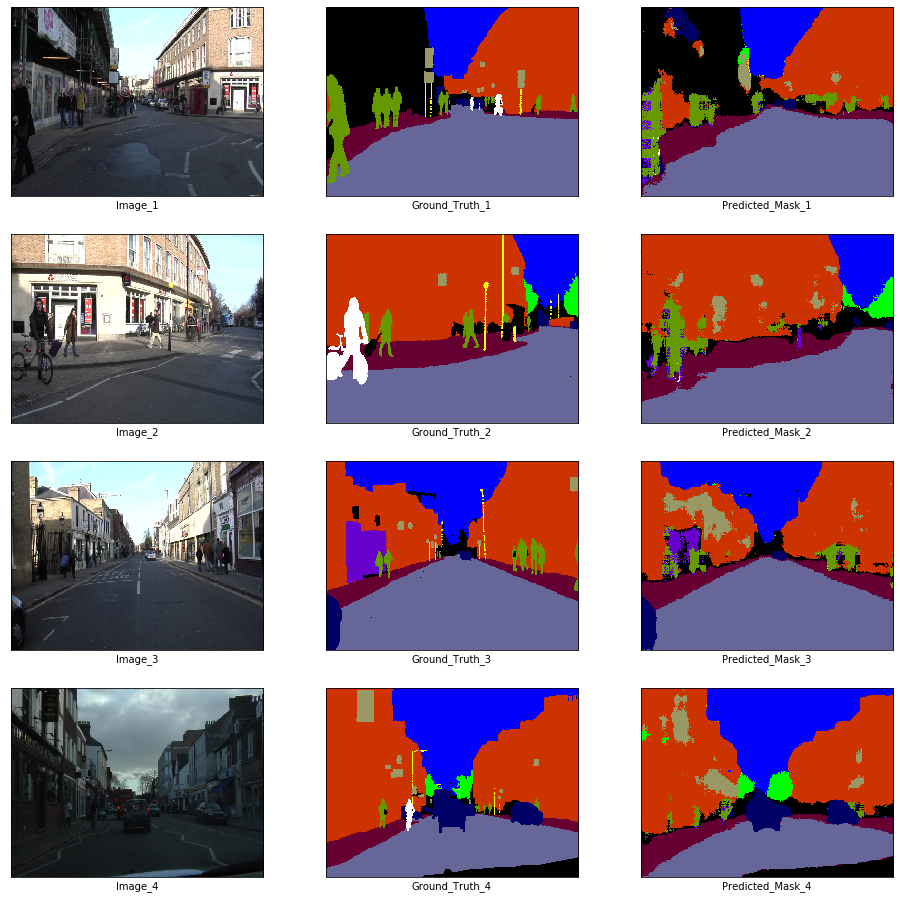

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 26



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.7508822596735425
Training Time: 40.43114900588989 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.089488983154297
Epoch 27



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.7701169782214694
Training Time: 40.773329973220825 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.375491142272949
Epoch 28



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.7387499610582987
Training Time: 41.26720976829529 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.88793420791626
Epoch 29



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6841694447729323
Training Time: 39.91312646865845 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.076960563659668
Epoch 30



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6885917650328742
Training Time: 40.675979137420654 seconds


100%|██████████| 10/10 [00:09<00:00,  1.09it/s]


Validation Loss: -6.1667256355285645


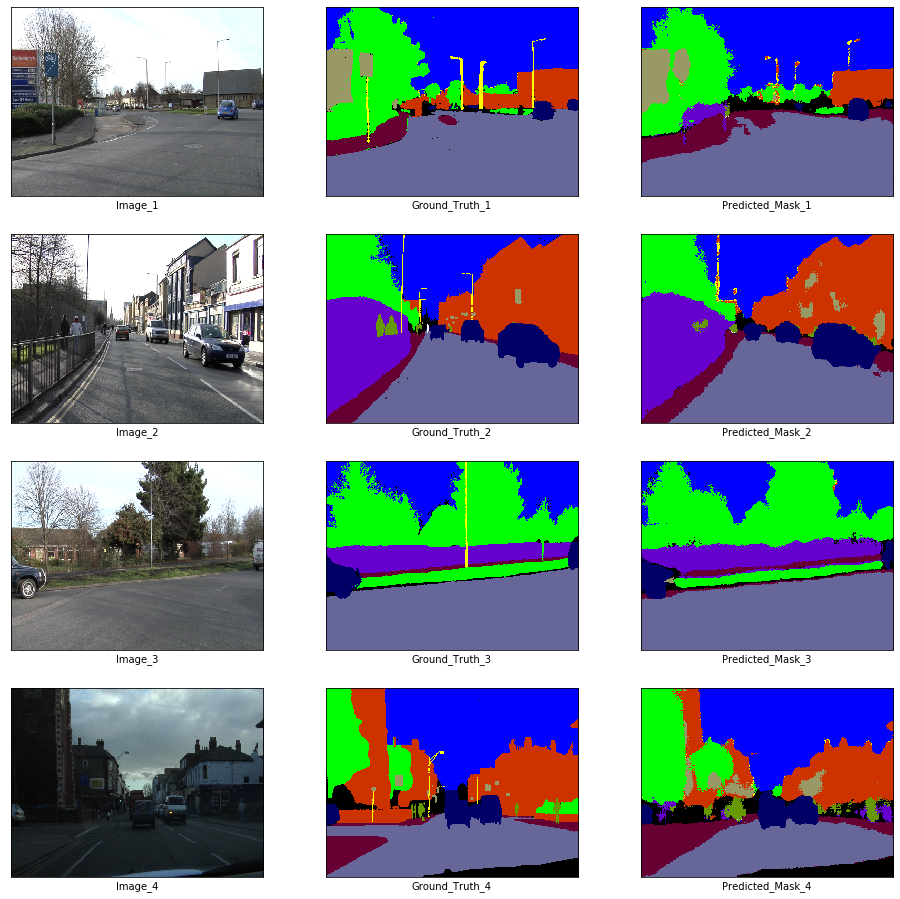

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 31



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6792279515001509
Training Time: 41.87136507034302 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.9902801513671875
Epoch 32



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6891773541768392
Training Time: 40.61734867095947 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.856400966644287
Epoch 33



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6400752456651794
Training Time: 40.40646553039551 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.903716564178467
Epoch 34



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6240335669782426
Training Time: 41.107645750045776 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.71940803527832
Epoch 35



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6304044938749738
Training Time: 40.08882117271423 seconds


100%|██████████| 10/10 [00:09<00:00,  1.10it/s]


Validation Loss: -4.791797637939453


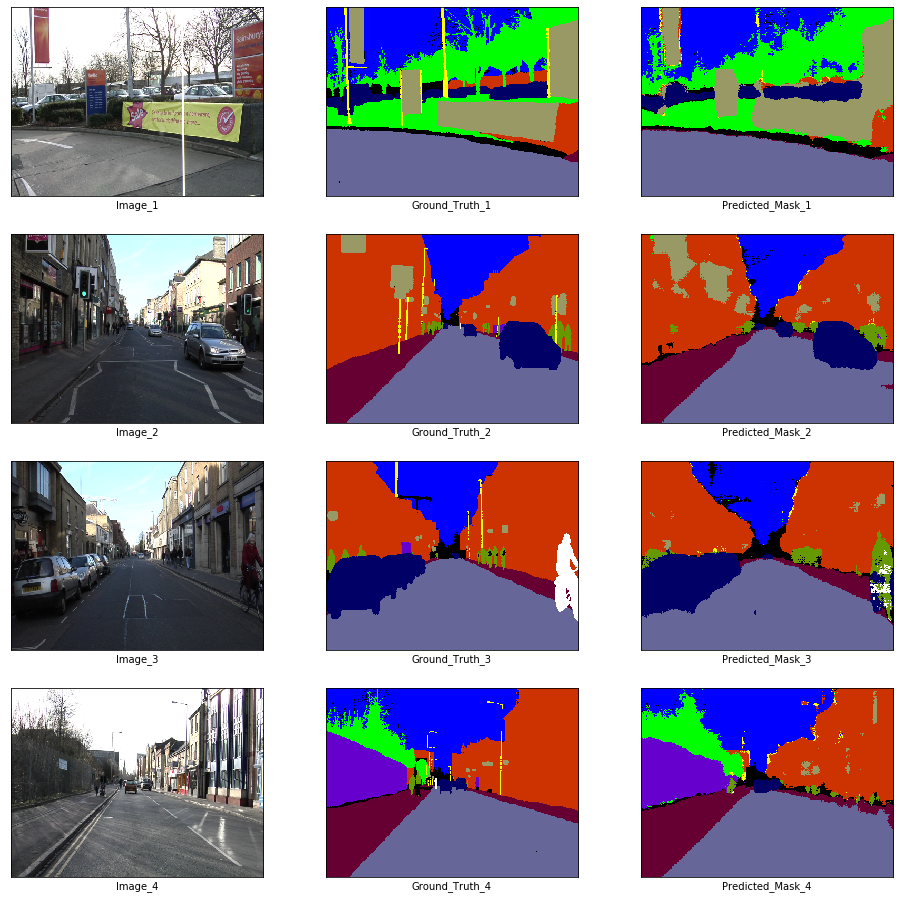

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 36



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6309192213747237
Training Time: 41.252562284469604 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.390324592590332
Epoch 37



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.6199058410194185
Training Time: 40.37794041633606 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.8094866275787354
Epoch 38



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5941000067525439
Training Time: 42.981149673461914 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.341751575469971
Epoch 39



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5949836042192247
Training Time: 42.73309659957886 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -7.610823154449463
Epoch 40



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5890304760800468
Training Time: 41.713314056396484 seconds


100%|██████████| 10/10 [00:09<00:00,  1.11it/s]


Validation Loss: -5.601530075073242


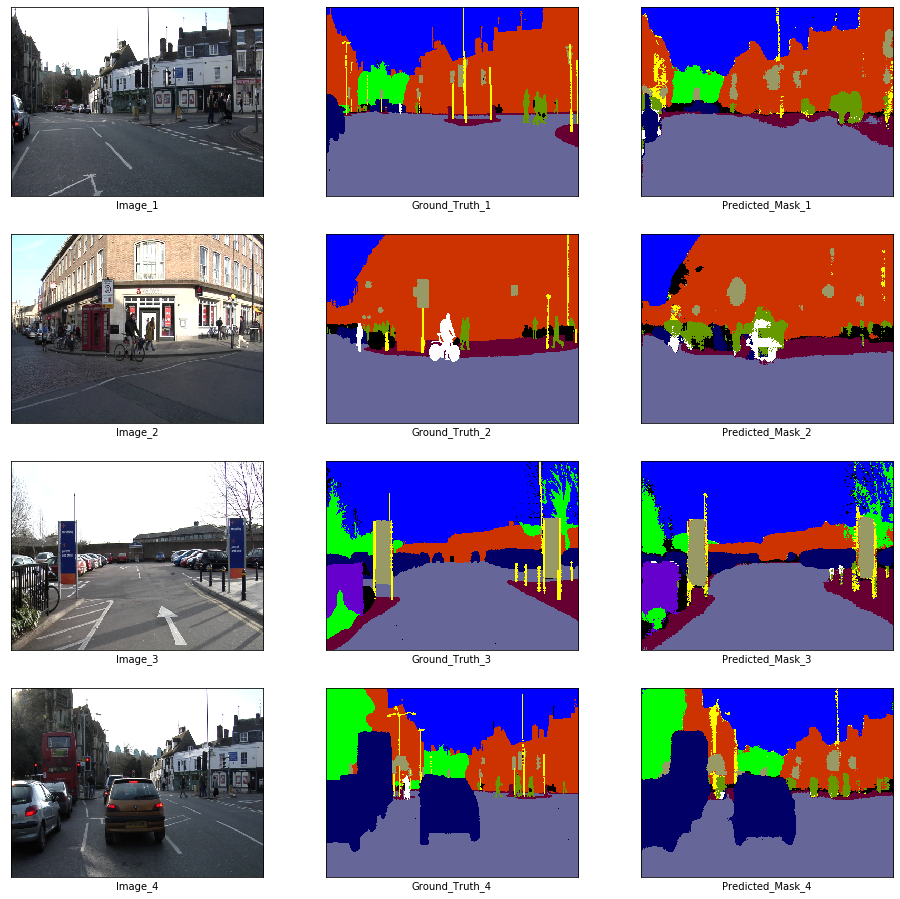

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 41



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5692226332094934
Training Time: 41.330257415771484 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.010176181793213
Epoch 42



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5436695681677924
Training Time: 41.4222195148468 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.492374420166016
Epoch 43



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.544019410179721
Training Time: 40.7962543964386 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.782113075256348
Epoch 44



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5375593503316244
Training Time: 41.62808346748352 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -7.810453414916992
Epoch 45



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5369900092482567
Training Time: 41.23817443847656 seconds


100%|██████████| 10/10 [00:09<00:00,  1.07it/s]


Validation Loss: -4.852654457092285


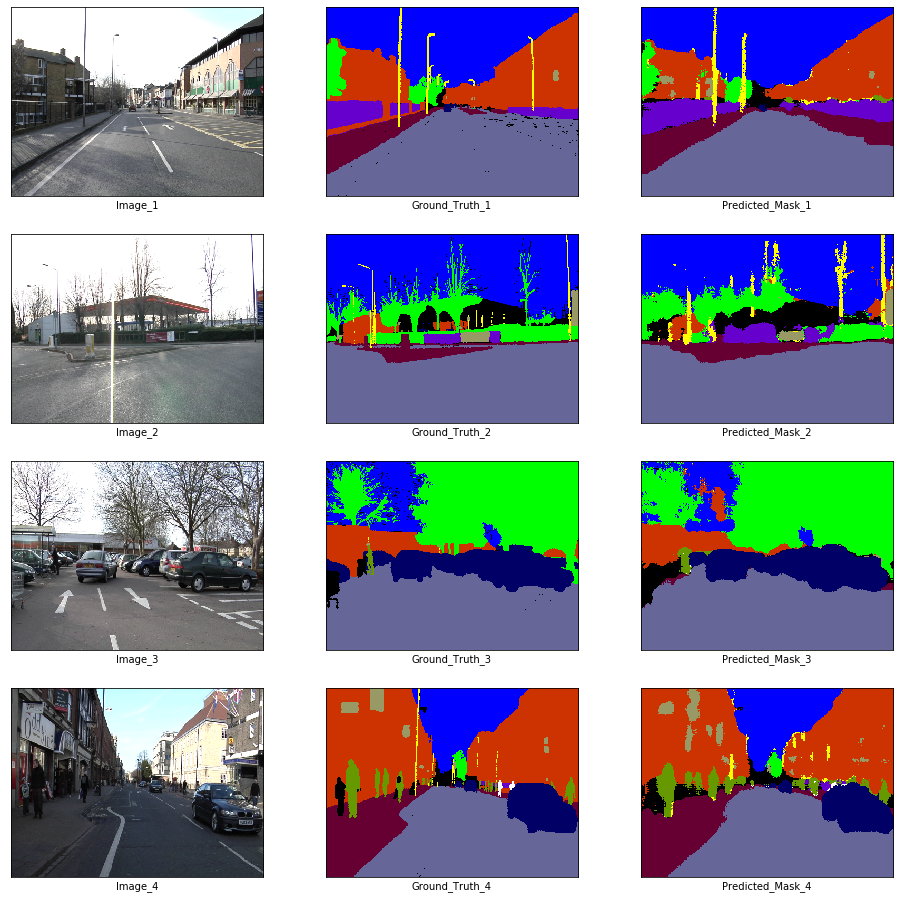

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 46



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5362356710765097
Training Time: 41.264116287231445 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.36365270614624
Epoch 47



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5027116917901568
Training Time: 40.71130061149597 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.880609035491943
Epoch 48



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5135523743099637
Training Time: 41.61816215515137 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.9932122230529785
Epoch 49



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.5004993122484949
Training Time: 41.515339612960815 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.213273048400879
Epoch 50



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.49891462673743564
Training Time: 40.64581751823425 seconds


100%|██████████| 10/10 [00:08<00:00,  1.14it/s]


Validation Loss: -3.9432687759399414


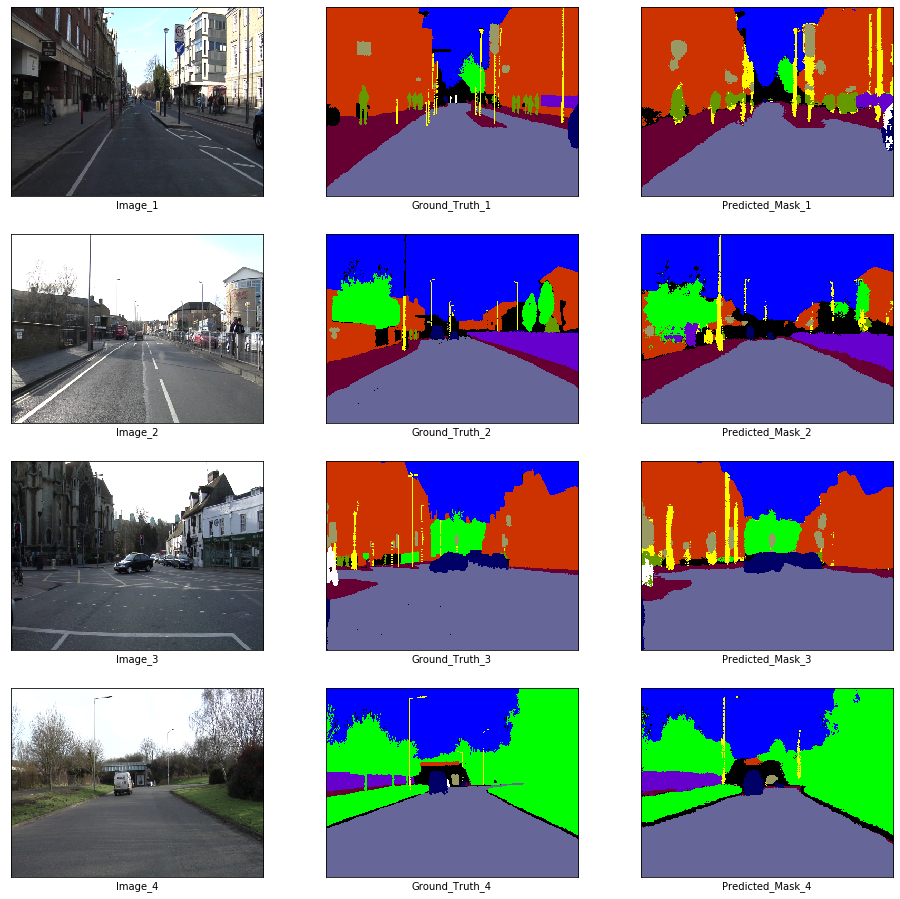

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 51



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.48800694694121677
Training Time: 42.97286558151245 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.55621862411499
Epoch 52



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.486121051841312
Training Time: 40.87683463096619 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.401822090148926
Epoch 53



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4640532268418206
Training Time: 41.54431748390198 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.312361717224121
Epoch 54



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.48886223634084064
Training Time: 42.19503474235535 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -5.540971755981445
Epoch 55



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4652596223685477
Training Time: 40.73843240737915 seconds


100%|██████████| 10/10 [00:08<00:00,  1.14it/s]


Validation Loss: -4.3155107498168945


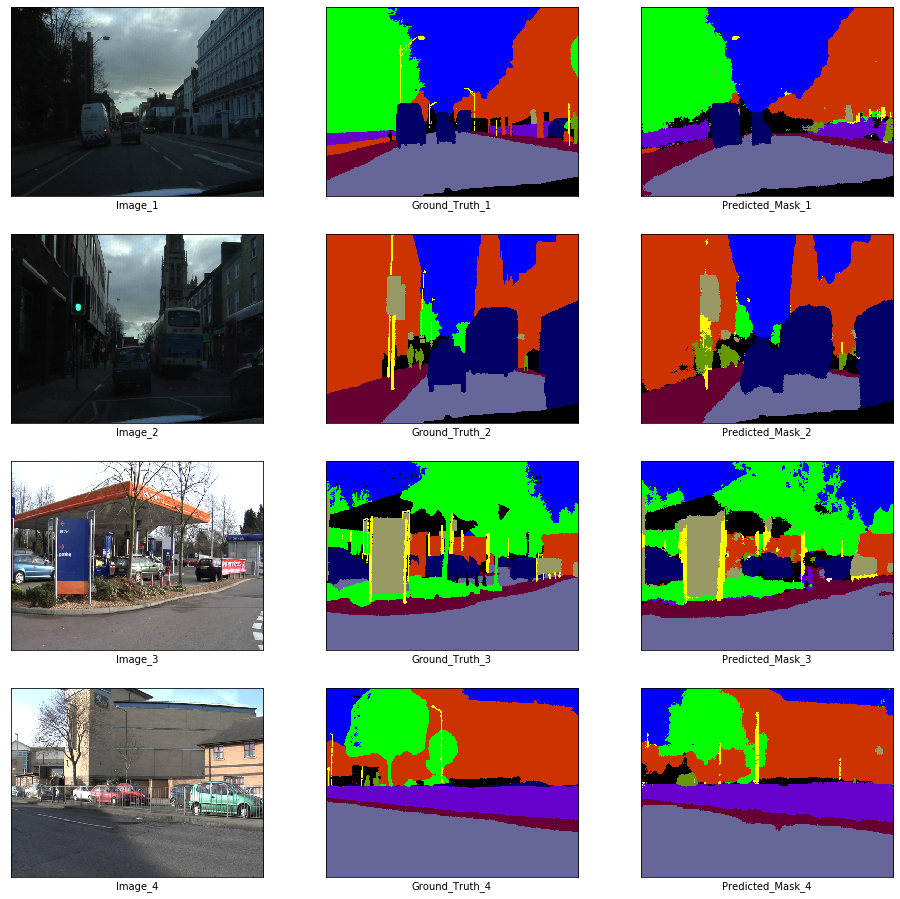

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 56



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4749726818667518
Training Time: 41.16943097114563 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.6192431449890137
Epoch 57



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.44121139662133324
Training Time: 41.20625686645508 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.031010150909424
Epoch 58



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4615819189283583
Training Time: 40.61237955093384 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.340782642364502
Epoch 59



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.44662850350141525
Training Time: 41.230860471725464 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.648172378540039
Epoch 60



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.43611373504002887
Training Time: 41.058759689331055 seconds


100%|██████████| 10/10 [00:08<00:00,  1.14it/s]


Validation Loss: -3.8927342891693115


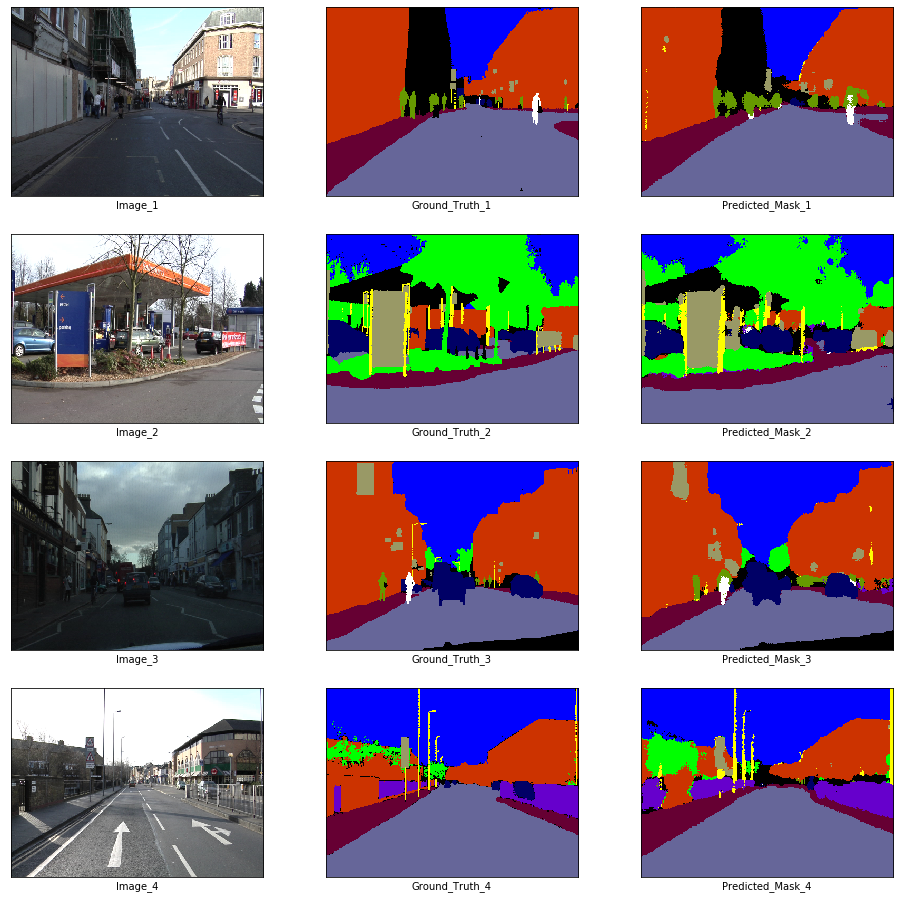

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 61



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4529963731765747
Training Time: 40.88716125488281 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.88596773147583
Epoch 62



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4309595334861014
Training Time: 41.36252427101135 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.03078556060791
Epoch 63



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.41166330377260846
Training Time: 41.55983924865723 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.4956369400024414
Epoch 64



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.41466913372278214
Training Time: 40.69584560394287 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.303359270095825
Epoch 65



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.42981116639243233
Training Time: 42.4230797290802 seconds


100%|██████████| 10/10 [00:08<00:00,  1.12it/s]


Validation Loss: -4.242055416107178


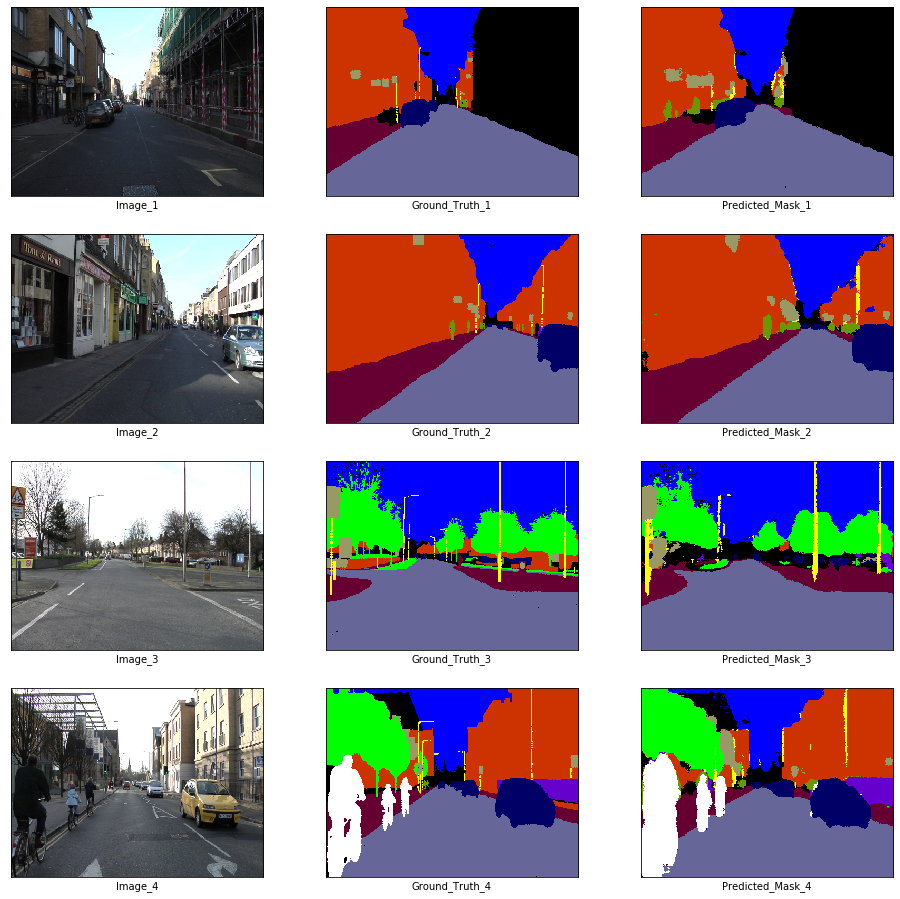

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 66



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3924887420402633
Training Time: 40.5323805809021 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.5901546478271484
Epoch 67



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.41154590000708896
Training Time: 41.673813343048096 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.8098320960998535
Epoch 68



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3891761526465416
Training Time: 40.60662269592285 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.159467697143555
Epoch 69



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.404221810400486
Training Time: 40.67538070678711 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.0017457008361816
Epoch 70



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3981318159235848
Training Time: 42.063674449920654 seconds


100%|██████████| 10/10 [00:08<00:00,  1.13it/s]


Validation Loss: -3.479609489440918


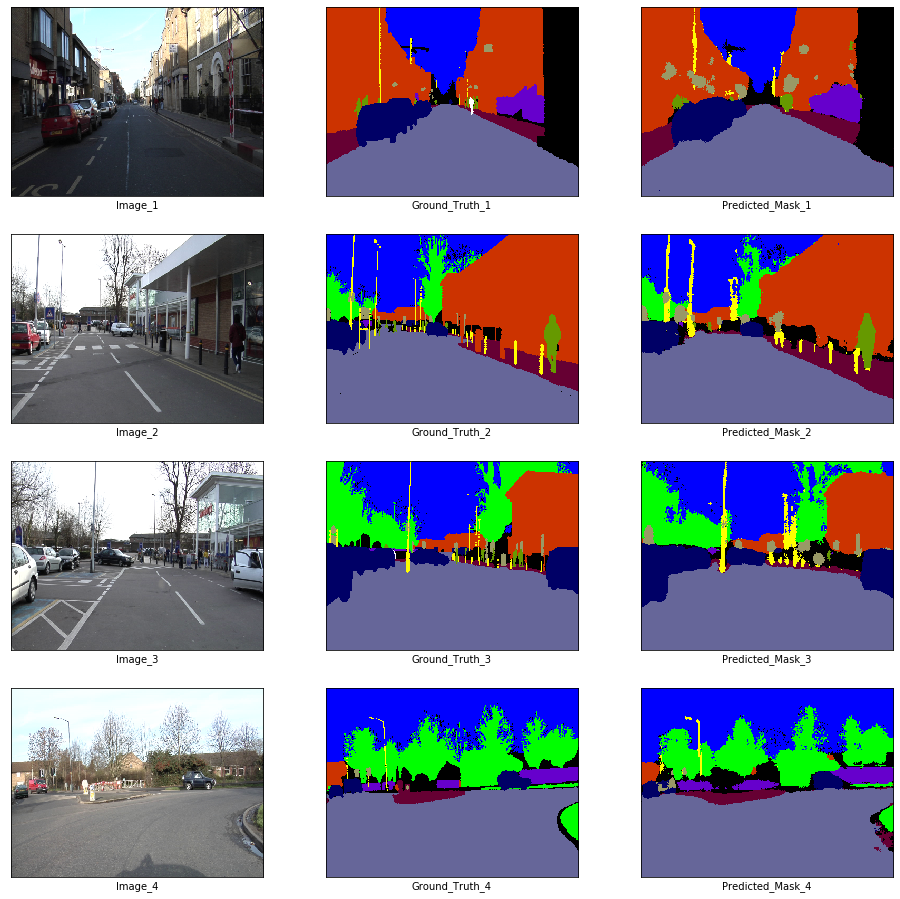

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 71



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3996603522035811
Training Time: 41.06094312667847 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.271501064300537
Epoch 72



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.4055372691816754
Training Time: 42.00496315956116 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.162489175796509
Epoch 73



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3803521999054485
Training Time: 41.583186626434326 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.9663591384887695
Epoch 74



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3788926651080449
Training Time: 40.86600422859192 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.6965460777282715
Epoch 75



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.37986888819270664
Training Time: 40.966174364089966 seconds


100%|██████████| 10/10 [00:08<00:00,  1.13it/s]


Validation Loss: -3.6114258766174316


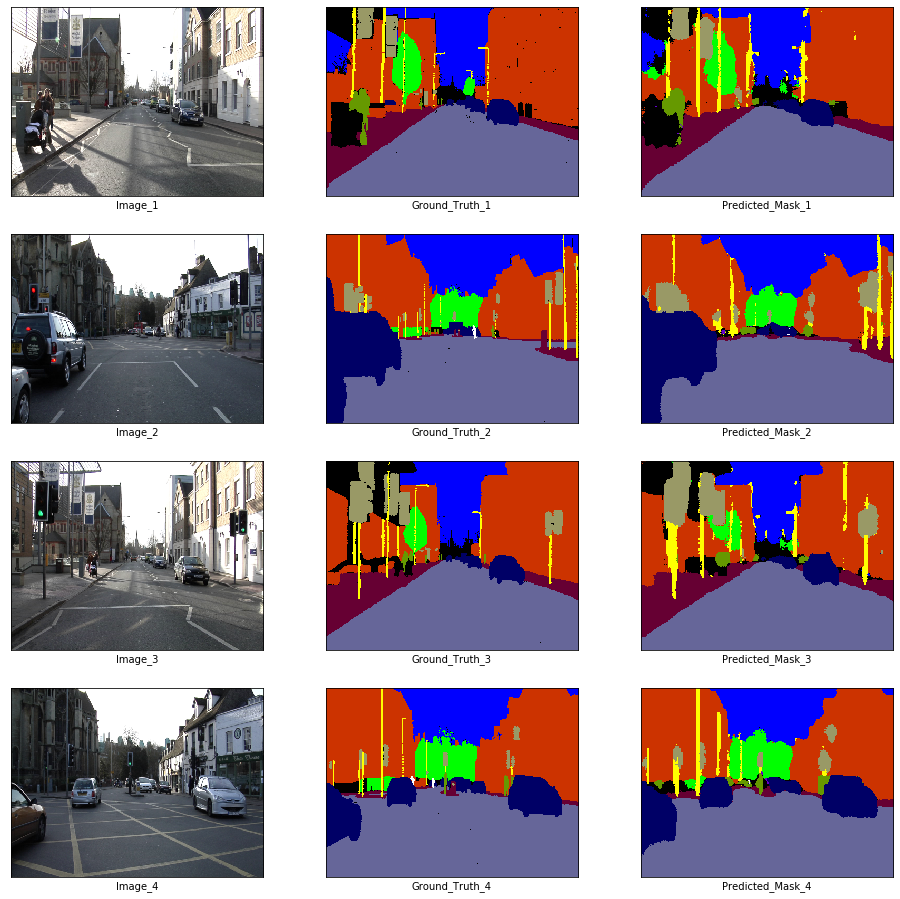

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 76



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3850344485706753
Training Time: 40.70187306404114 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.0271449089050293
Epoch 77



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.367544498708513
Training Time: 43.144068002700806 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.219241142272949
Epoch 78



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.36943962011072373
Training Time: 40.434935569763184 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.7908787727355957
Epoch 79



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3753080012069808
Training Time: 41.10566544532776 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -6.691986083984375
Epoch 80



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.36800634529855514
Training Time: 41.553741216659546 seconds


100%|██████████| 10/10 [00:09<00:00,  1.08it/s]


Validation Loss: -3.3467142581939697


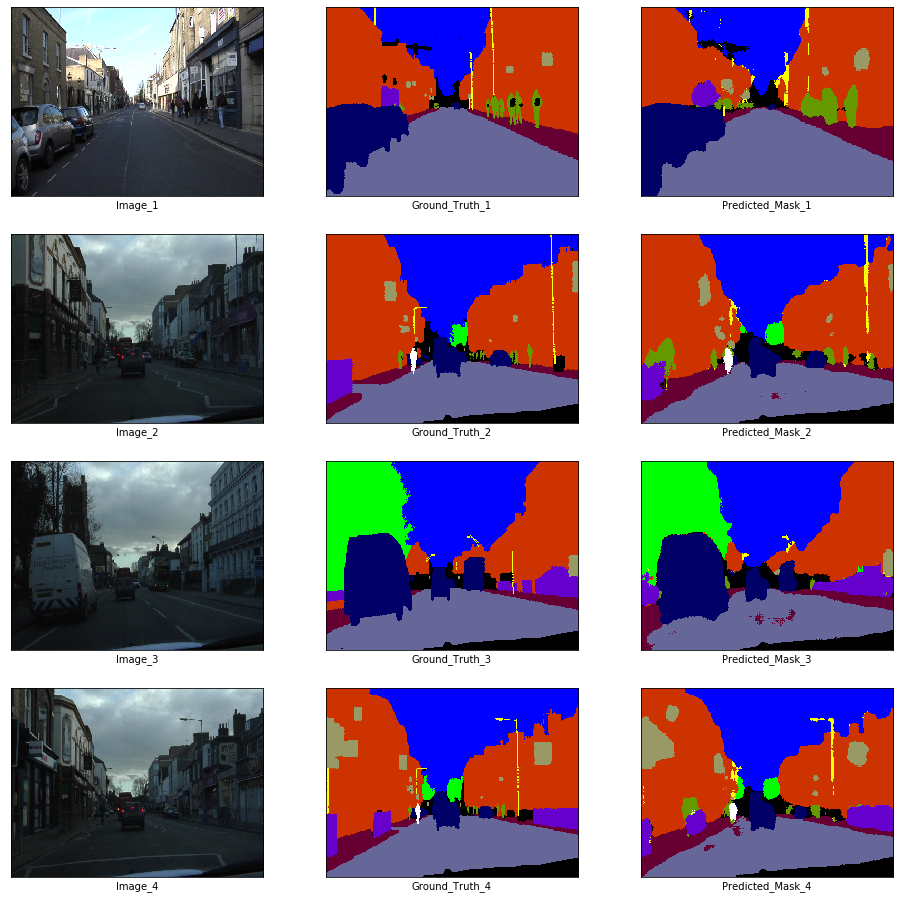

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 81



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.38409088800350827
Training Time: 41.344653367996216 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.991565227508545
Epoch 82



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3566820215847757
Training Time: 40.43417692184448 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.334347724914551
Epoch 83



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.36557432181305355
Training Time: 40.92824959754944 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.1150617599487305
Epoch 84



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.36253494024276733
Training Time: 41.384669065475464 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.3027377128601074
Epoch 85



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3501717332336638
Training Time: 42.11008143424988 seconds


100%|██████████| 10/10 [00:08<00:00,  1.15it/s]


Validation Loss: -4.108462333679199


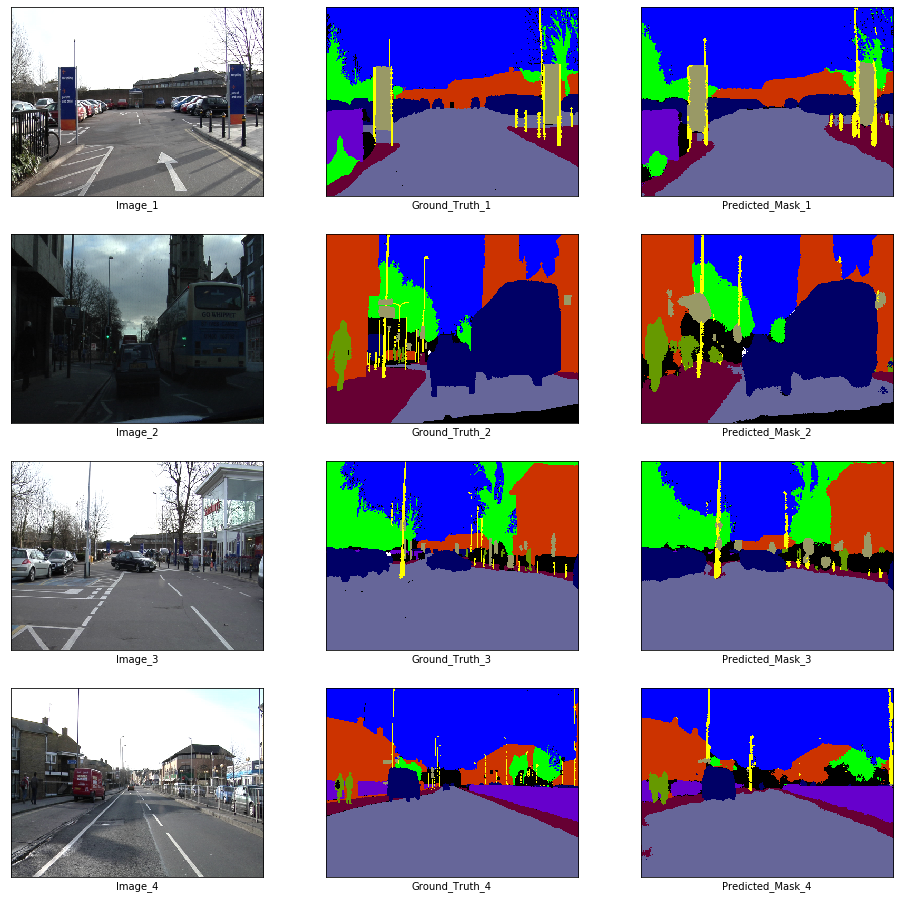

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 86



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.35500235358874005
Training Time: 41.95062065124512 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.4464035034179688
Epoch 87



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.36751314335399204
Training Time: 41.90937900543213 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -4.568727016448975
Epoch 88



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3410744501484765
Training Time: 41.00954246520996 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.9973819255828857
Epoch 89



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3550916189948718
Training Time: 41.77543807029724 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.015855312347412
Epoch 90



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3472161814570427
Training Time: 40.88187289237976 seconds


100%|██████████| 10/10 [00:08<00:00,  1.14it/s]


Validation Loss: -2.578002691268921


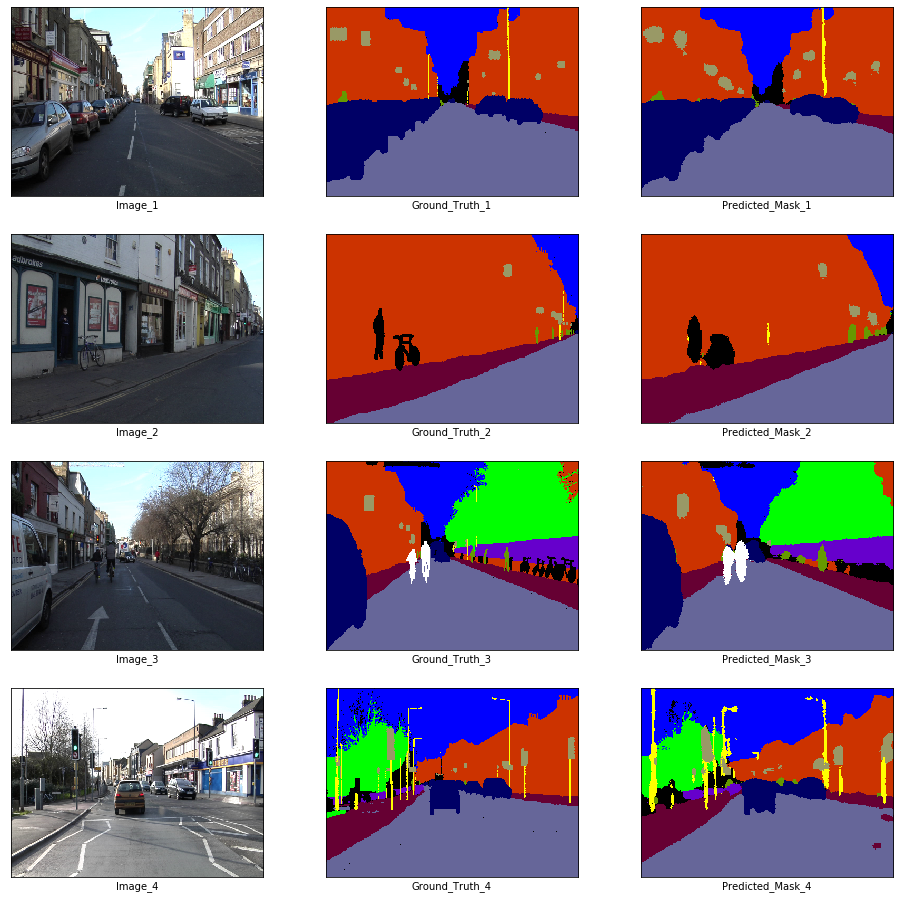

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 91



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3564860282672776
Training Time: 42.26561498641968 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.561209201812744
Epoch 92



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.33936263538069195
Training Time: 41.09875798225403 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.171251058578491
Epoch 93



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3428431335422728
Training Time: 40.621673583984375 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.991868495941162
Epoch 94



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3362953969173961
Training Time: 41.187084436416626 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -2.613081932067871
Epoch 95



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.33196596635712516
Training Time: 40.814178228378296 seconds


100%|██████████| 10/10 [00:08<00:00,  1.13it/s]


Validation Loss: -3.1854944229125977


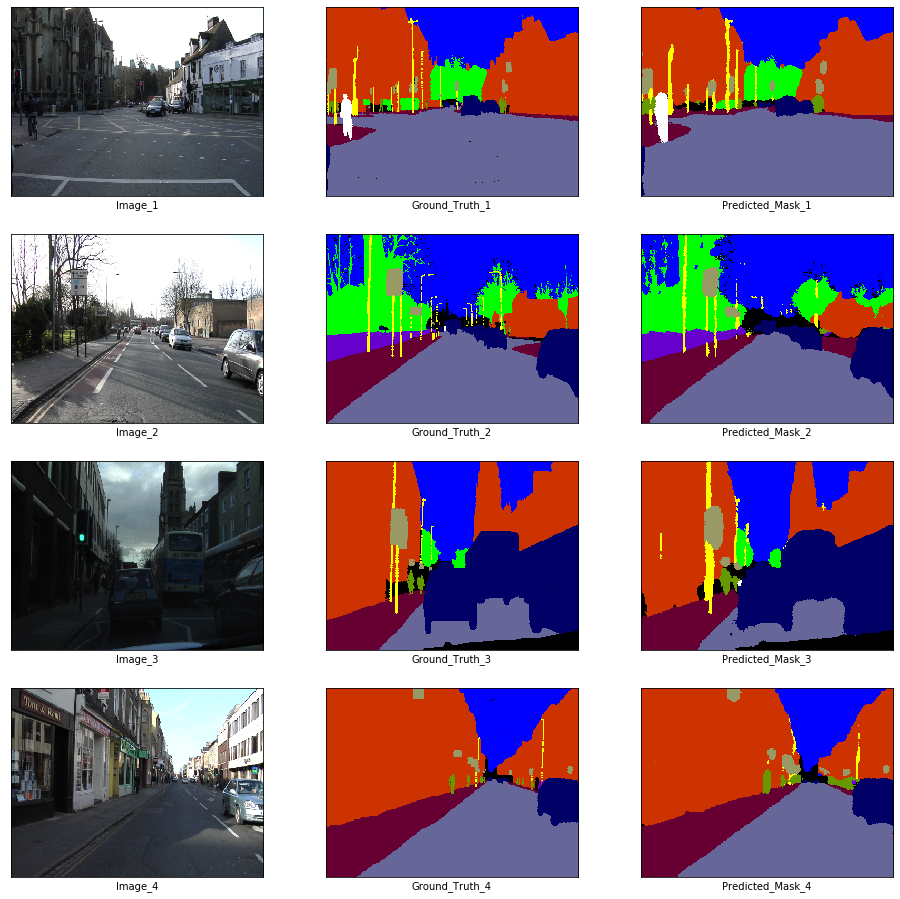

  0%|          | 0/36 [00:00<?, ?it/s]

Checkpoint saved
Epoch 96



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.33072182743085754
Training Time: 41.39825797080994 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.0743582248687744
Epoch 97



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.33086403956015903
Training Time: 40.829829692840576 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.3679614067077637
Epoch 98



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.32032152596447205
Training Time: 39.931591749191284 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -3.526409149169922
Epoch 99



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3402672095431222
Training Time: 39.8062698841095 seconds


  0%|          | 0/36 [00:00<?, ?it/s]


Validation Loss: -1.9183818101882935
Epoch 100



  0%|          | 0/10 [00:00<?, ?it/s]


Training Loss: 0.3387918935881721
Training Time: 39.90468955039978 seconds


100%|██████████| 10/10 [00:09<00:00,  1.05it/s]


Validation Loss: -3.1717822551727295


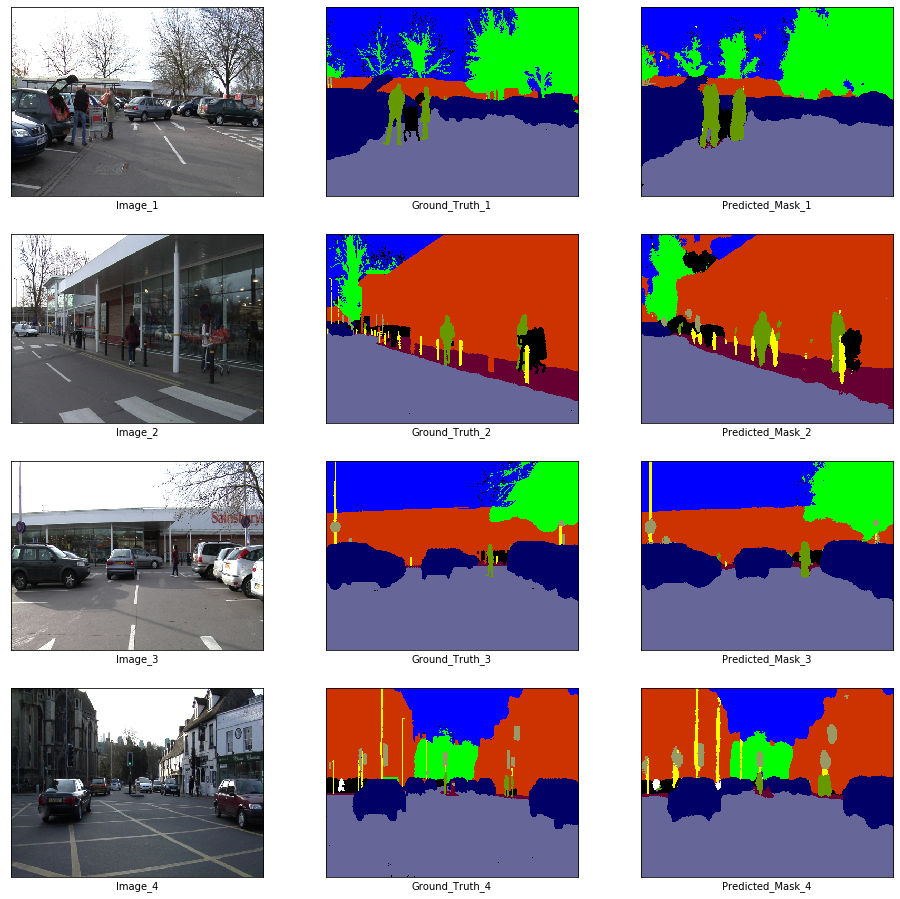

Checkpoint saved

Training Done.
Training Mean Loss: 0.653944
Validation Mean Loss: -4.158924


In [25]:
train_loss_history, val_loss_history = train(
    enet, train_loader, val_loader,
    device, criterion, optimizer,
    len(train_images) // batch_size,
    len(val_images) // batch_size, 5,
    5, './checkpoints', 'enet-model', 100
)

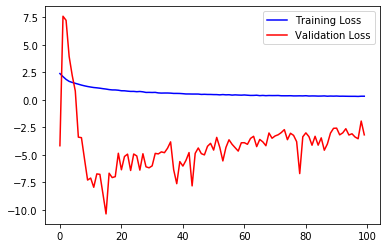

In [26]:
plt.plot(train_loss_history, color = 'b', label = 'Training Loss')
plt.plot(val_loss_history, color = 'r', label = 'Validation Loss')
plt.legend()
plt.show()

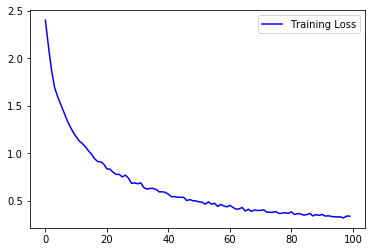

In [27]:
plt.plot(train_loss_history, color = 'b', label = 'Training Loss')
plt.legend()
plt.show()

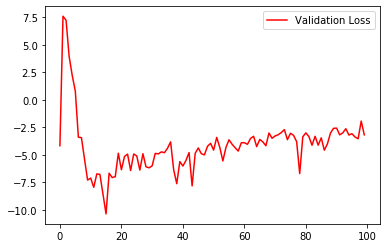

In [28]:
plt.plot(val_loss_history, color = 'r', label = 'Validation Loss')
plt.legend()
plt.show()

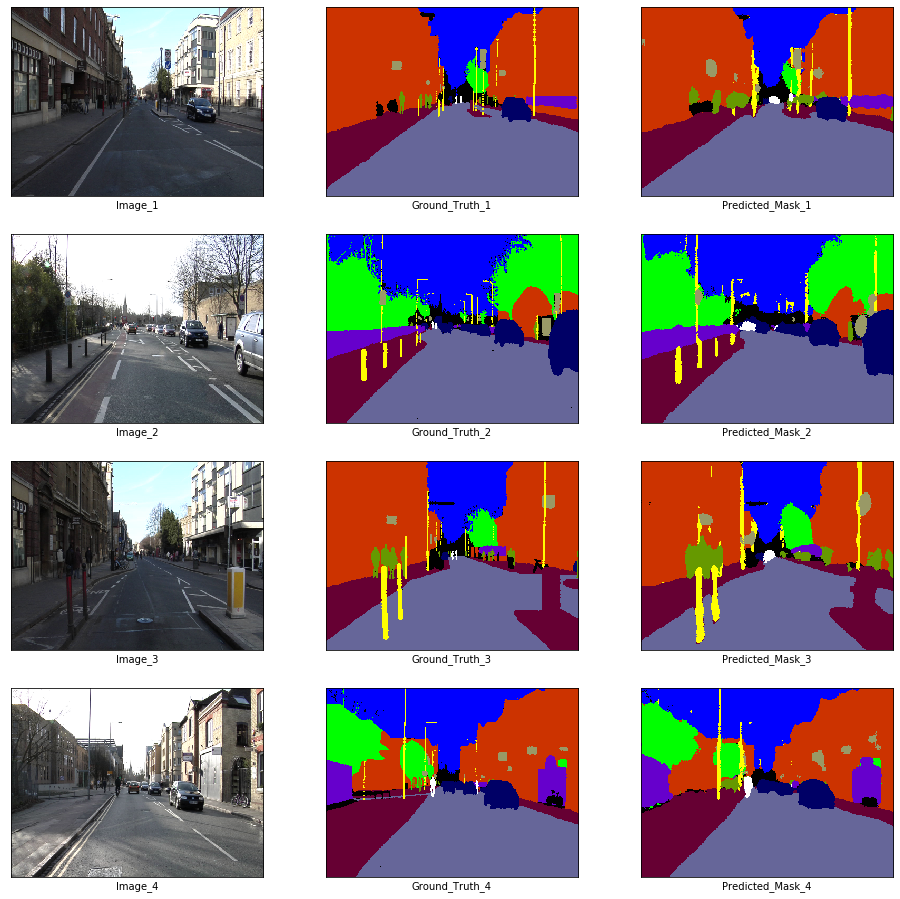

In [29]:
x_batch, y_batch = next(iter(train_loader))
fig, axes = plt.subplots(nrows = 4, ncols = 3, figsize = (16, 16))
plt.setp(axes.flat, xticks = [], yticks = [])
c = 1
for i, ax in enumerate(axes.flat):
    if i % 3 == 0:
        ax.imshow(ToPILImage()(x_batch[c]))
        ax.set_xlabel('Image_' + str(c))
    elif i % 3 == 1:
        ax.imshow(decode_segmap(y_batch[c], color_dict))
        ax.set_xlabel('Ground_Truth_' + str(c))
    elif i % 3 == 2:
        ax.imshow(predict_rgb(enet, x_batch[c].unsqueeze(0).to(device), color_dict))
        ax.set_xlabel('Predicted_Mask_' + str(c))
        c += 1
plt.show()

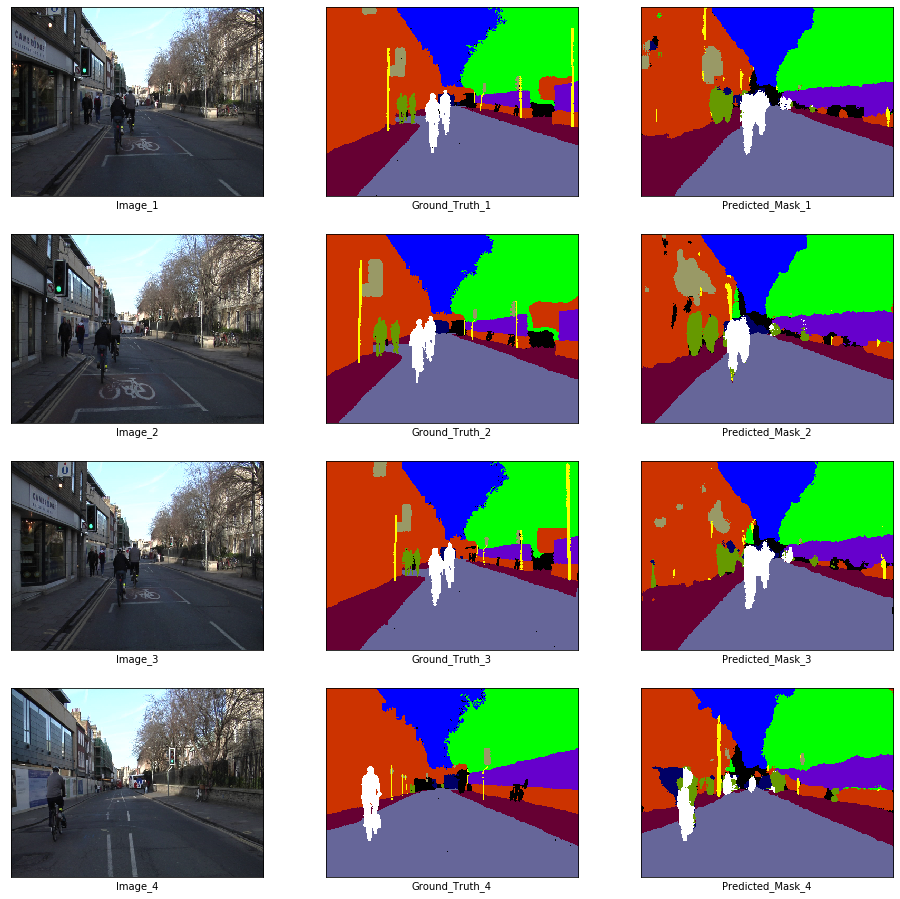

In [30]:
x_batch, y_batch = next(iter(val_loader))
fig, axes = plt.subplots(nrows = 4, ncols = 3, figsize = (16, 16))
plt.setp(axes.flat, xticks = [], yticks = [])
c = 1
for i, ax in enumerate(axes.flat):
    if i % 3 == 0:
        ax.imshow(ToPILImage()(x_batch[c]))
        ax.set_xlabel('Image_' + str(c))
    elif i % 3 == 1:
        ax.imshow(decode_segmap(y_batch[c], color_dict))
        ax.set_xlabel('Ground_Truth_' + str(c))
    elif i % 3 == 2:
        ax.imshow(predict_rgb(enet, x_batch[c].unsqueeze(0).to(device), color_dict))
        ax.set_xlabel('Predicted_Mask_' + str(c))
        c += 1
plt.show()

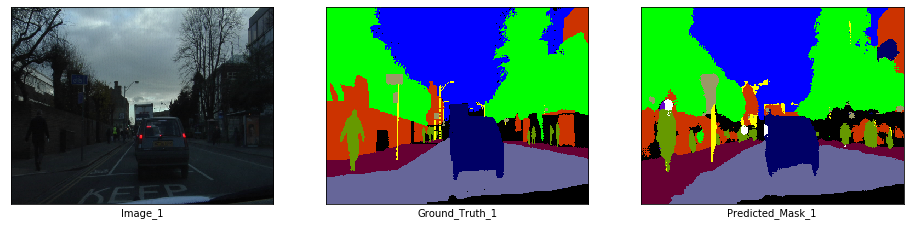

In [32]:
x_batch, y_batch = next(iter(test_loader))
fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (16, 16))
plt.setp(axes.flat, xticks = [], yticks = [])
c = 1
for i, ax in enumerate(axes.flat):
    if i % 3 == 0:
        ax.imshow(ToPILImage()(x_batch[c]))
        ax.set_xlabel('Image_' + str(c))
    elif i % 3 == 1:
        ax.imshow(decode_segmap(y_batch[c], color_dict))
        ax.set_xlabel('Ground_Truth_' + str(c))
    elif i % 3 == 2:
        ax.imshow(predict_rgb(enet, x_batch[c].unsqueeze(0).to(device), color_dict))
        ax.set_xlabel('Predicted_Mask_' + str(c))
        c += 1
plt.show()